In [16]:
import cv2
import csv
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt

In [17]:
# Define the path to the directory containing images
path = r'C:\Users\mathe\Ufal\PDI\Deffect-detection\lego'  # Adjust this to your actual image directory path

# Read train.csv file
train_df = pd.read_csv('train.csv')
test_df = pd.read_csv('test.csv')

# Extract the list of training image IDs
listTrain = train_df['example_id'].values.tolist()


print(f"Loaded {len(listTrain)} training images from train.csv")
print(f"Image directory: {path}")

Loaded 90 training images from train.csv
Image directory: C:\Users\mathe\Ufal\PDI\Deffect-detection\lego


##Desenvolvimento

###Funções de Ajuste

In [18]:
def getPictures():
  train, test = [], []
  for i in os.listdir(path):
    # Image
    img = cv2.imread(os.path.join(path, i))
    # Adjusts height
    h = img.shape[0]
    img = img[int(0.095*h):int(0.905*h), :]
    # set the lists
    img_id = i.rsplit('.', 1)[0]
    if img_id in set(listTrain):
      train.append([img, img_id])
    else:
      test.append([img, img_id])
  return train,test

def getIndexLeft(img):
  h, w = img.shape
  index = -1
  for i in range(0, w//2):
    count = 0
    for j in range(h):
      if img[j, i] > 128:
        img[j, i] = 255
      count = count + img[j, i]
    if count == 255*h:
      index = i
  return index

def getIndexRight(img,id):
    h, w = img.shape
    index = -100000
    if id == 'yasvgpdjm':
      return w - 20
    for i in range(w-1,int(0.63*w),-1):
      count = 0
      for j in range(h):
        if img[j, i] > 128:
          img[j, i] = 255
        count = count + img[j, i]
      if count == 255*h:
        index = i
    if index >= 0:
      return index
    else:
      l = []
      for i in range(int(0.75*w), w):
        count = 0
        for j in range(h):
          count = count + img[j, i]
        l.append(count)
      return l.index(max(l)) + int(0.75*w)

def getStatusCenter(img):
  h, w = img.shape
  i = 0
  j = 0
  for k in range(h):
    i = i + img[k, int(((3*w)//7))]
    j = j + img[k, int(((5*w)//7))]
  if j == 255*h and i == 255*h:
    return True
  return False

def translateImg(img):
  first_row = img[0, :, :]
  non_white_mask = np.any(first_row != [255, 255, 255], axis=1)
  non_white_indices = np.where(non_white_mask)[0]
  l = list(non_white_indices)
  if not l:
    h, w = img.shape[:2]
    return img[:,int((w-h)/2):w-int((w-h)/2)]
  h, w = img.shape[:2]
  non_white_center = int((min(l) + max(l)) / 2)
  image_center = w // 2
  shift = image_center - non_white_center
  M = np.float32([[1, 0, shift], [0, 1, 0]])
  i = cv2.warpAffine(img, M, (w, h), borderValue=(255, 255, 255))
  return i[:,int((w-h)/2):w-int((w-h)/2)]

def adjustLego():
  train, test = getPictures()
  l1, l2 = [], []
  for i,id in train:
    img = cv2.cvtColor(i, cv2.COLOR_BGR2GRAY)
    h, w = img.shape
    L = getIndexLeft(img)
    R = getIndexRight(img,id)
    # Left index
    if L >= 0:
      i[:h, :L-15] = 255
      img[:h, :L-15] = 255
    # Right index
    if R >= 0:
      i[:h, R:] = 255
      img[:h, R:] = 255
    # Center Status
    if getStatusCenter(img):
      i[i>=0] = 255
    # Center img
    i = translateImg(i)
    l1.append([i,id])
  for i,id in test:
    img = cv2.cvtColor(i, cv2.COLOR_BGR2GRAY)
    h, w = img.shape
    L = getIndexLeft(img)
    R = getIndexRight(img,id)
    # Left index
    if L >= 0:
      i[:h, :L-15] = 255
      img[:h, :L-15] = 255
    # Right index
    if R >= 0:
      i[:h, R:] = 255
      img[:h, R:] = 255
    # Center Status
    if getStatusCenter(img):
      i[i>=0] = 255
    # Center img
    i = translateImg(i)
    l2.append([i,id])
  return l1,l2

def canny(l1,l2):
  aux1,aux2 = l1.copy(), l2.copy()
  r1, r2 = [], []
  for i,id in aux1:
    img = cv2.cvtColor(i, cv2.COLOR_BGR2GRAY)
    height, width = img.shape
    imgScale = cv2.convertScaleAbs(img, alpha=1.2, beta=-200)
    edges = cv2.Canny(imgScale, 50, 150)
    h, w = edges.shape
    for j in range(h):
        # Encontrar o primeiro índice não nulo
        first_nonzero = np.where(edges[j,:] > 0)[0]
        if first_nonzero.size > 0:
            first_idx = first_nonzero[0]
            edges[j, first_idx] = 0

        # Encontrar o último índice não nulo
        last_nonzero = np.where(edges[j,:] > 0)[0]
        if last_nonzero.size > 0:
            last_idx = last_nonzero[-1]
            edges[j, last_idx] = 0
    r1.append([edges,id])
  h, w = edges.shape
  for i,id in aux2:
    img = cv2.cvtColor(i, cv2.COLOR_BGR2GRAY)
    height, width = img.shape
    imgScale = cv2.convertScaleAbs(img, alpha=1.2, beta=-200)
    edges = cv2.Canny(imgScale, 50, 150)
    h, w = edges.shape
    for j in range(h):
        # Encontrar o primeiro índice não nulo
        first_nonzero = np.where(edges[j,:] > 0)[0]
        if first_nonzero.size > 0:
            first_idx = first_nonzero[0]
            edges[j, first_idx] = 0

        # Encontrar o último índice não nulo
        last_nonzero = np.where(edges[j,:] > 0)[0]
        if last_nonzero.size > 0:
            last_idx = last_nonzero[-1]
            edges[j, last_idx] = 0
    r2.append([edges,id])
  return r1,r2


def rotate(l1,l2):
  reserved = ['apsjdmgyv', 'ajsdmvypg', 'damgvpyjs', 'gavdysmpj', 'jypgsvadm', 'gmdypvasj', 'pmvgdajsy', 'pmdgasjvy', 'vaspmgjyd', 'vjgsypamd', 'jyvspamdg', 'pgvmyjsad', 'myjsdgpav', 'yasvgpdjm', 'ygjdmpvas', 'ygdjpvasm', 'gdayvspjm', 'dsmjgpyva', 'mvyagpjds', 'spdgjavmy', 'ysgavdpjm']
  # rotateL0 = 8
  rotateL0 = ['dgpmysvja', 'pvjsgadmy', 'pjsgaydvm' ]
  # rotateL1 = 15
  rotateL1 = ['apmjvdgys', 'avdmyspjg', 'gayjdmsvp', 'gamdsyvpj', 'gjamydvps', 'jymspvagd', 'gdpasmyjv', 'sdpgavymj', 'sgmypajdv', 'pmagdsvjy', 'payvjsdmg', 'pmvgdjsya', 'sdpygmjva', 'magdspjyv', 'vyjgampsd']
  # rotateL2 = 23
  rotateL2 = ['djvmsypga', 'gypsamvdj', 'gjaydmpvs', 'jsavdgmpy', 'pagjsvdym', 'smajygdvp', 'vamdgpysj', 'vypdsmajg', 'ydjmvgspa', 'vajmygdps', 'vpysmdjag']
  # rotateL3 = 30
  rotateL3 = ['djmygaspv', 'dpyagjmsv', 'ygmavjsdp', 'vjdamyspg']
  # rotateL4 = 48
  rotateL4 = ['djsyamvpg', 'pjmvsaygd', 'mygjpasdv', 'gmvasyjdp']
  # rotateL5 = 55
  rotateL5 = ['pyajsgdvm', 'dyjmgvpas']
  # rotateL6 = 70
  rotateL6 = ['pgsjavydm', 'ymvpdjags']
  # rotateL7 = 85
  rotateL7 = ['gsvpydjam']
  # rotateL8 = 100
  rotateL8 = ['pmgsvayjd']
  # rotateL9 = 140
  rotateL9 = ['psjvdygam', 'vjpmaydgs']
  # rotateR1 = -9
  rotateR1 = ['ajgyvdsmp', 'djpamsvyg', 'dapysjvmg', 'gmpjsdyva', 'jmgpysdav', 'sadgjpyvm', 'pjvasmdyg', 'vsymjpgad', 'sgvydajmp', 'yadpvgmsj', 'gyapdvsmj', 'gyvdajpsm', 'yavmpgjsd', 'vjpgadmsy', 'vmyjdpsga']
  # rotateR2 = -19
  rotateR2 = ['aymdvsgjp', 'dvsgjyamp', 'dyagsmjpv', 'javpsymdg', 'jvpyadmsg', 'mjydaspvg', 'mvdsagyjp', 'mvdgjspay', 'pyjvsadmg', 'sygmdvpaj', 'sypavdgmj', 'dsmyjvgap', 'jygvdapms', 'sjdmavygp', 'ydsvmjagp']
  # rotateR3 = -26
  rotateR3 = ['jdpvagysm', 'jspgvdyam', 'gjysadvpm', 'paygmvsjd', 'pjmgsavdy', 'pdmjvgyas', 'psmaygjvd', 'pjmygdasv', 'saymjdvgp', 'mdjgyasvp', 'mvgspjayd', 'yajmgvpsd', 'pjdgasymv']
  # rotateR4 = -35
  rotateR4 = ['pvagsjdmy', 'vsaypdjmg', 'smgjavydp', 'jympsdagv']
  # rotateR5 = -45
  rotateR5 = ['agmpdjsyv', 'ysavdgpmj', 'ysmdjavgp']
  # rotateR6 = -55
  rotateR6 = ['jdgmyvspa']
  # rotateR7 = -90
  rotateR7 = ['sgpdmajvy']
  # rotateR8 = -105
  rotateR8 = ['gvpdjyasm', 'ypsvjgdam']
  # rotateR9 = -140
  rotateR9 = ['adsyjmgvp', 'dyjmagvsp']
  # rotateR10 = -160
  rotateR10 = ['gamysvpjd']
  aux1,aux2 = l1.copy(), l2.copy()
  r1 = []
  r2 = []
  for i,id in aux1:
    h, w = i.shape
    center = (w // 2, h // 2)
    angle = 0
    if id in rotateL0:
      angle = 8
    elif id in rotateL1:
      angle = 15
    elif id in rotateL2:
      angle = 23
    elif id in rotateL3:
      angle = 30
    elif id in rotateL4:
      angle = 48
    elif id in rotateL5:
      angle = 55
    elif id in rotateL6:
      angle = 70
    elif id in rotateL7:
      angle = 85
    elif id in rotateL8:
      angle = 100
    elif id in rotateL9:
      angle = 140
    elif id in rotateR1:
      angle = -9
    elif id in rotateR2:
      angle = -19
    elif id in rotateR3:
      angle = -26
    elif id in rotateR4:
      angle = -35
    elif id in rotateR5:
      angle = -45
    elif id in rotateR6:
      angle = -55
    elif id in rotateR7:
      angle = -90
    elif id in rotateR8:
      angle = -105
    elif id in rotateR9:
      angle = -140
    elif id in rotateR10:
      angle = -160
    if angle != 0:
      M = cv2.getRotationMatrix2D(center, angle , 1.0)
      i = cv2.warpAffine(i, M, (w, h), borderMode=cv2.BORDER_CONSTANT, borderValue=(0, 0, 0))
    _, imgBin = cv2.threshold(i, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    r1.append([imgBin,id])
  for i,id in aux2:
    h, w = i.shape
    center = (w // 2, h // 2)
    angle = 0
    if id in rotateL0:
      angle = 8
    elif id in rotateL1:
      angle = 15
    elif id in rotateL2:
      angle = 23
    elif id in rotateL3:
      angle = 30
    elif id in rotateL4:
      angle = 48
    elif id in rotateL5:
      angle = 55
    elif id in rotateL6:
      angle = 70
    elif id in rotateL7:
      angle = 85
    elif id in rotateL8:
      angle = 100
    elif id in rotateL9:
      angle = 140
    elif id in rotateR1:
      angle = -9
    elif id in rotateR2:
      angle = -19
    elif id in rotateR3:
      angle = -26
    elif id in rotateR4:
      angle = -35
    elif id in rotateR5:
      angle = -45
    elif id in rotateR6:
      angle = -55
    elif id in rotateR7:
      angle = -90
    elif id in rotateR8:
      angle = -105
    elif id in rotateR9:
      angle = -140
    elif id in rotateR10:
      angle = -160
    if angle != 0:
      M = cv2.getRotationMatrix2D(center, angle , 1.0)
      i = cv2.warpAffine(i, M, (w, h), borderMode=cv2.BORDER_CONSTANT, borderValue=(0, 0, 0))
    _, imgBin = cv2.threshold(i, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    r2.append([imgBin,id])
  return r1, r2

###Chamada de Funções de Ajuste

In [19]:
_, test = getPictures()
for i in test:
  cv2.imshow(i[0])

AttributeError: 'NoneType' object has no attribute 'shape'

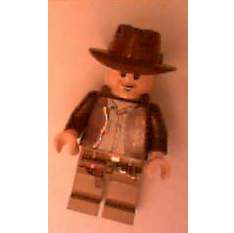

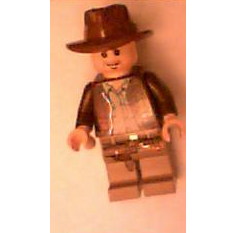

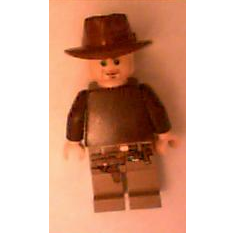

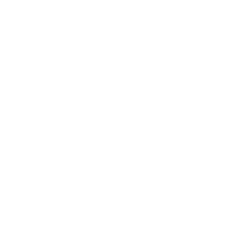

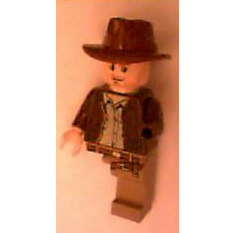

...

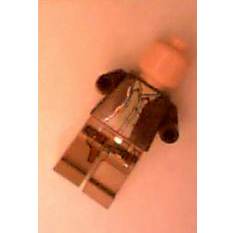

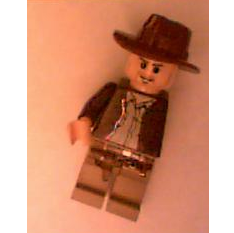

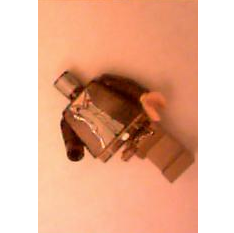

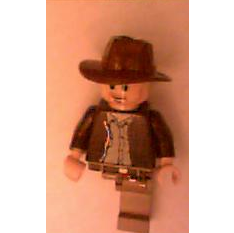

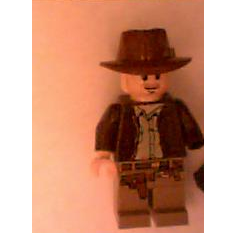

In [ ]:
l1,l2 = adjustLego()
for i in l1:
  cv2.imshow(i[0])
for i in l2:
  cv2.imshow(i[0])

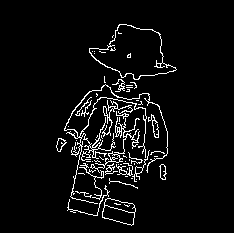

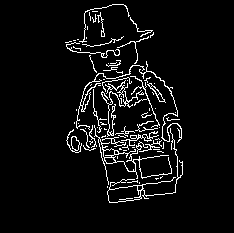

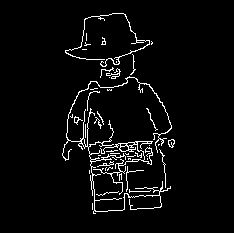

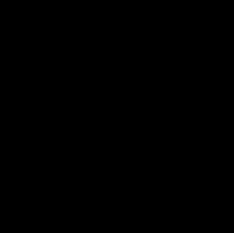

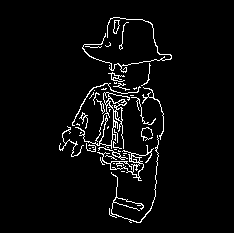

...

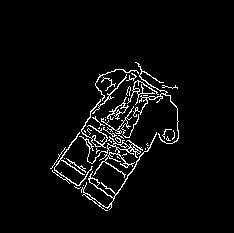

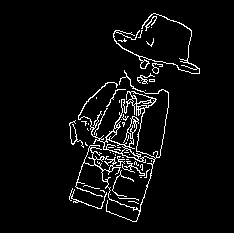

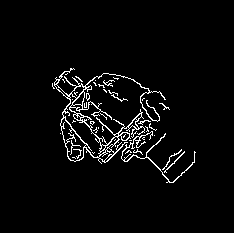

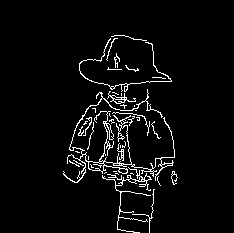

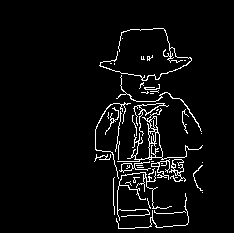

In [ ]:
l1,l2 = canny(l1,l2)
for i in l1:
  cv2.imshow(i[0])
for i in l2:
  cv2.imshow(i[0])

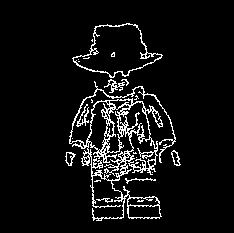

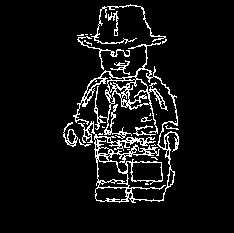

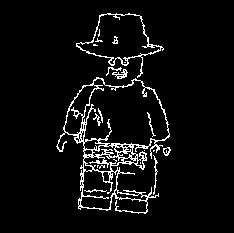

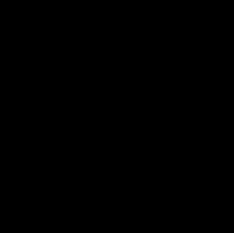

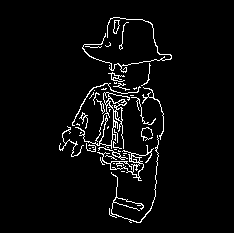

...

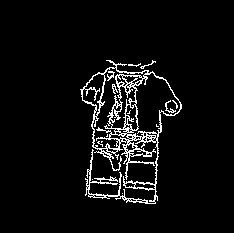

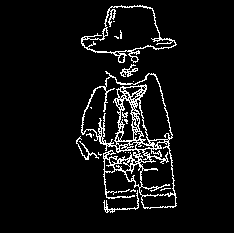

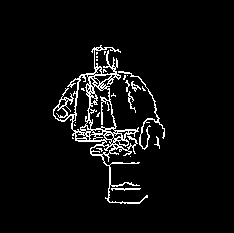

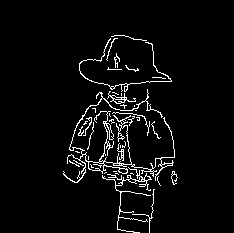

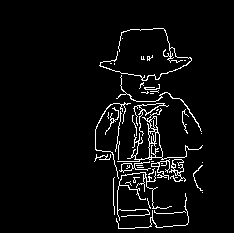

In [ ]:
l1,l2 = rotate(l1,l2)
for i in l1:
  cv2.imshow(i[0])
for i in l2:
  cv2.imshow(i[0])

###Funções de Extração das features

In [ ]:
def getStatusLegs(img):
  h, w = img.shape
  i = img[int(0.79*h):h,:]
  soma_colunas = np.sum(i, axis=0)
  colunas_ativas = np.where(soma_colunas > 0)[0]
  if len(colunas_ativas) == 0 or np.ptp(colunas_ativas) < 65:
    return 1
  return 0

def getStatusHat(img):
  h, w = img.shape
  i = img[:int(0.25*h),:]
  soma_colunas = np.sum(i, axis=0)
  colunas_ativas = np.where(soma_colunas > 0)[0]
  if len(colunas_ativas) == 0 or np.ptp(colunas_ativas) < 40:
    return 1
  return 0

def getStatusHead(img):
  if getStatusHat(img) == 0:
    return 0
  h, w = img.shape
  i = img[:int(0.26*h),:]
  a = np.array(i)
  if (np.count_nonzero(a == 255)) < 50:
    return 0
  return 1

def getStatusFace(img):
  if getStatusHead(img) == 1:
    return 1
  h = img.shape[0]
  aux = img[int(0.21*h):int(0.4*h),:]
  if np.all(aux[0, :] != 255) and getStatusHat(img) == 1:
    return 1
  i = -1
  for j, linha in enumerate(img):
    if np.any(linha == 255):
      i = j
      break
  aux = img[i+50:i+61,:]
  if (np.count_nonzero(np.array(aux) == 255)) < 55:
    return 1
  return 0

def getStatusBody(img):
  h,w = img.shape
  i = 10
  for j in range(h - 1, -1, -1):
    linha = img[j, :]
    if np.any(linha == 255):
      i = j
      break
  aux = img[i-115:i-65,(w//2)-25:(w//2)+25]
  if (np.count_nonzero(np.array(aux) == 255)) < 350:
    return 1
  return 0

def getStatusArm(img):
  h,w = img.shape
  i = 10
  for j in range(h - 1, -1, -1):
    linha = img[j, :]
    if np.any(linha == 255):
      i = j
      break
  v = -1
  for j in range(img[i-10:i,:].shape[1] - 1, -1, -1):
    coluna = img[i-10:i,:][:, j]
    if np.any(coluna == 255):
      v = j
      break
  aux = img[i-100:i-55,v:]
  if (np.count_nonzero(np.array(aux) == 255)) == 0:
    return 1
  return 0

def generateFeatures(l2):
  features = []
  l = l2.copy()
  for i,id in l:
    a = np.array(i)
    q = np.count_nonzero(a == 255)
    if q == 0:
      features.append([i,[id,0,0,0,0,0,0,0,0]])
    else:
      soma = getStatusLegs(i) + getStatusHat(i) + getStatusHead(i) + getStatusFace(i) + getStatusBody(i) + getStatusArm(i) + getStatusArm(i)
      if soma > 1:
        soma = 1
      features.append([i,[id,soma,getStatusHat(i),getStatusFace(i),getStatusHead(i),getStatusLegs(i),getStatusBody(i),getStatusArm(i),getStatusArm(i)]])
  return sorted(features, key=lambda x: x[1][0])

###Extração das features

In [ ]:
features = generateFeatures(l2)

['dpyagjmsv', 1, 0, 0, 0, 0, 1, 0, 0]


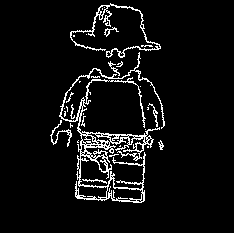

['dsmyjvgap', 1, 0, 1, 0, 1, 0, 0, 0]


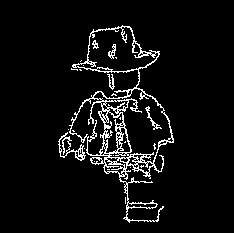

['dyjmgvpas', 1, 1, 1, 1, 0, 0, 0, 0]


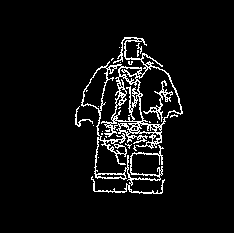

['gyapdvsmj', 0, 0, 0, 0, 0, 0, 0, 0]


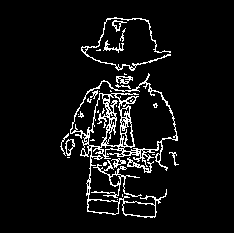

['gyvdajpsm', 0, 0, 0, 0, 0, 0, 0, 0]


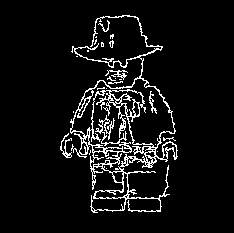

['jygvdapms', 1, 1, 1, 1, 0, 0, 0, 0]


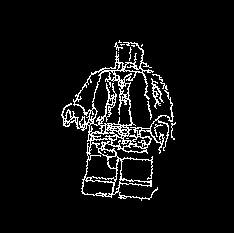

['jympsdagv', 0, 0, 0, 0, 0, 0, 0, 0]


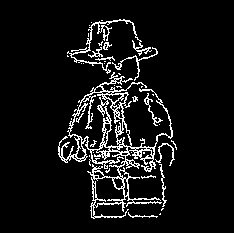

['jyvspamdg', 0, 0, 0, 0, 0, 0, 0, 0]


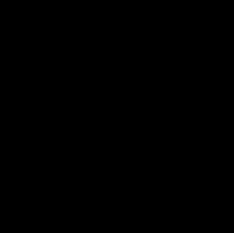

['magdspjyv', 1, 1, 1, 0, 0, 0, 0, 0]


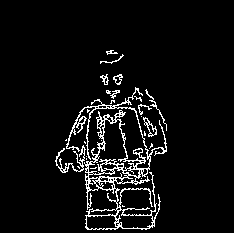

['mygjpasdv', 0, 0, 0, 0, 0, 0, 0, 0]


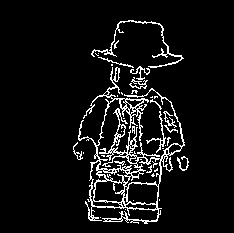

['myjsdgpav', 0, 0, 0, 0, 0, 0, 0, 0]


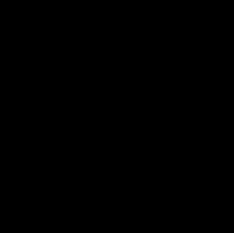

['pgvmyjsad', 0, 0, 0, 0, 0, 0, 0, 0]


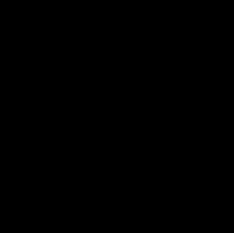

['pjdgasymv', 0, 0, 0, 0, 0, 0, 0, 0]


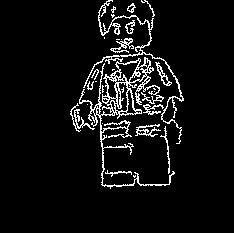

['sdpygmjva', 1, 0, 0, 0, 1, 0, 0, 0]


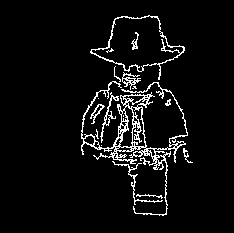

['sjdmavygp', 1, 1, 0, 0, 0, 0, 0, 0]


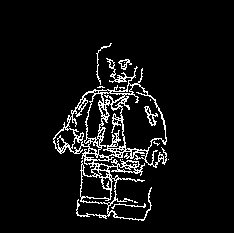

['vajmygdps', 1, 0, 1, 0, 0, 0, 0, 0]


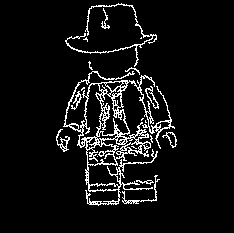

['vjdamyspg', 1, 1, 1, 0, 0, 0, 0, 0]


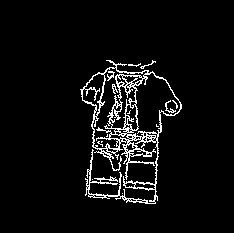

['vjpgadmsy', 1, 1, 1, 1, 0, 0, 0, 0]


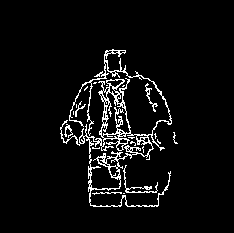

['vmyjdpsga', 0, 0, 0, 0, 0, 0, 0, 0]


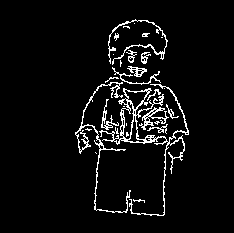

['vpysmdjag', 1, 0, 0, 0, 0, 0, 1, 1]


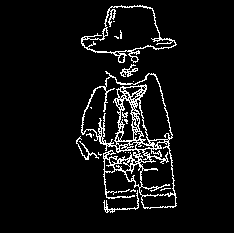

['vyjgampsd', 0, 0, 0, 0, 0, 0, 0, 0]


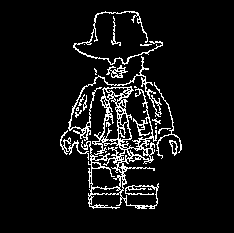

['yasvgpdjm', 0, 0, 0, 0, 0, 0, 0, 0]


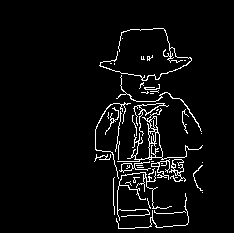

['yavmpgjsd', 0, 0, 0, 0, 0, 0, 0, 0]


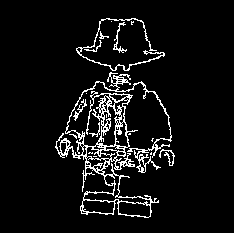

['ydjmvgspa', 1, 0, 0, 0, 1, 0, 0, 0]


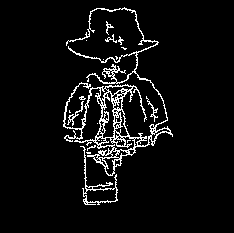

['ydsvmjagp', 1, 0, 0, 0, 0, 1, 0, 0]


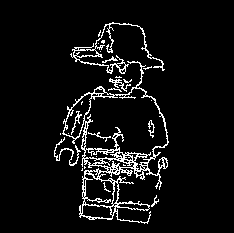

['ygdjpvasm', 1, 1, 1, 1, 0, 0, 0, 0]


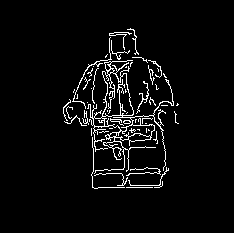

['ygjdmpvas', 1, 0, 0, 0, 0, 0, 1, 1]


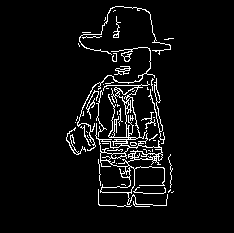

['ygmavjsdp', 0, 0, 0, 0, 0, 0, 0, 0]


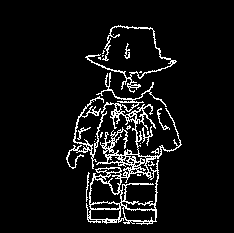

['ymvpdjags', 1, 1, 1, 1, 0, 0, 0, 0]


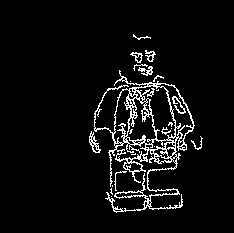

['ypsvjgdam', 0, 0, 0, 0, 0, 0, 0, 0]


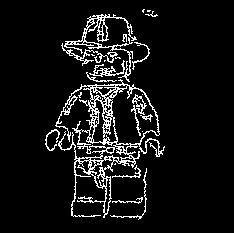

['ysavdgpmj', 0, 0, 0, 0, 0, 0, 0, 0]


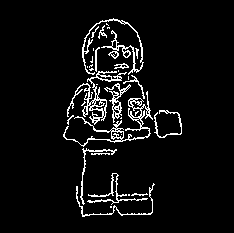

['ysgavdpjm', 1, 0, 0, 0, 1, 0, 0, 0]


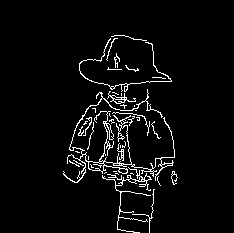

['ysmdjavgp', 1, 1, 1, 1, 1, 0, 0, 0]


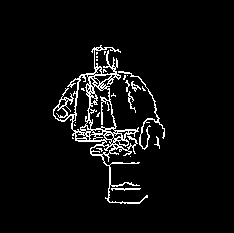

In [ ]:
for i in features:
  print(i[1])
  cv2.imshow(i[0])

### Geração de arquivo csv

In [ ]:
dates = []
for i in features:
  dates.append(i[1])

name = "saida.csv"
header = ["example_id", "has_deffect", "no_hat", "no_face", "no_head", "no_leg", "no_body", "no_hand", "no_arm"]

# Abrir o arquivo para escrita
with open("send.csv", 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(header)
    for l in dates:
        writer.writerow(l)